<h1><center> 02806 Social data analysis and visualization Spring 22 <br> <br> Final Project Assignment B </center></h1>

- This explainer notebook should contain all the behind the scenes data-analysis stuff, details on the dataset, why you've selected these particular visualizations, explanations methodology, etc.

- Make sure that you use references when they're needed and follow academic standards.

- The notebook should contain your analysis and code. Please structure it into the following sections

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import pmdarima as pmd

from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from statsmodels.tsa.seasonal import seasonal_decompose

import read
import model
import visualize
import utils

%matplotlib inline

# Part 1: Motivation

## 1.1: What is your dataset?

In [ ]:
# your code goes here

## 1.2: Why did you choose this/these particular dataset(s)?

## 1.3: What was your goal for the end user's experience?

# Part 2: Basic Statistics

## 2.1: Write about your choices in <font color='blue'>data cleaning and preprocessing </font>

**Answers:**

Pollution data:
* We have data from years 2000-2021. We have also older data, but we decided not to include it, because it is kept in a different format.
* Over the entire timespan there were over 1000 stations, but they were not equally distributed and form some measurements they were not present in some regions. We selected measurements basing on quality of the data:
- this and that and that
* There are changes in standard of station names and in standard of excel sheets format
* Data from 2021 is kept in a different format, because it is not verified yet
* We implemented a function to clean, read and reformat the data
* The most convinient format for the data is the long format, sowe we perform melting of the data

Mobility data:

* Preprocessing of the data follows other analysis of github, blah blah

In [69]:
df_mobility = read.get_mobility_data()

/home/rafaczd/Studia/sem10/SNaDV/project/read.py:116: DtypeWarning: Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("data/mobility_trend_2022_04_10.csv")


## 2.2: Write a short section that discusses the dataset stats, containing key points/plots from your <font color ='blue'>exploratory data analysis.</font>

**Answers:**

* map of stations in Poland, probably
* count total number of data cells
* include some plots from Haimi, general sstatistics


In [ ]:
# your code goes here -------- key plots from exploratory data analysis

In [149]:
geo_data = read.get_geo_data()

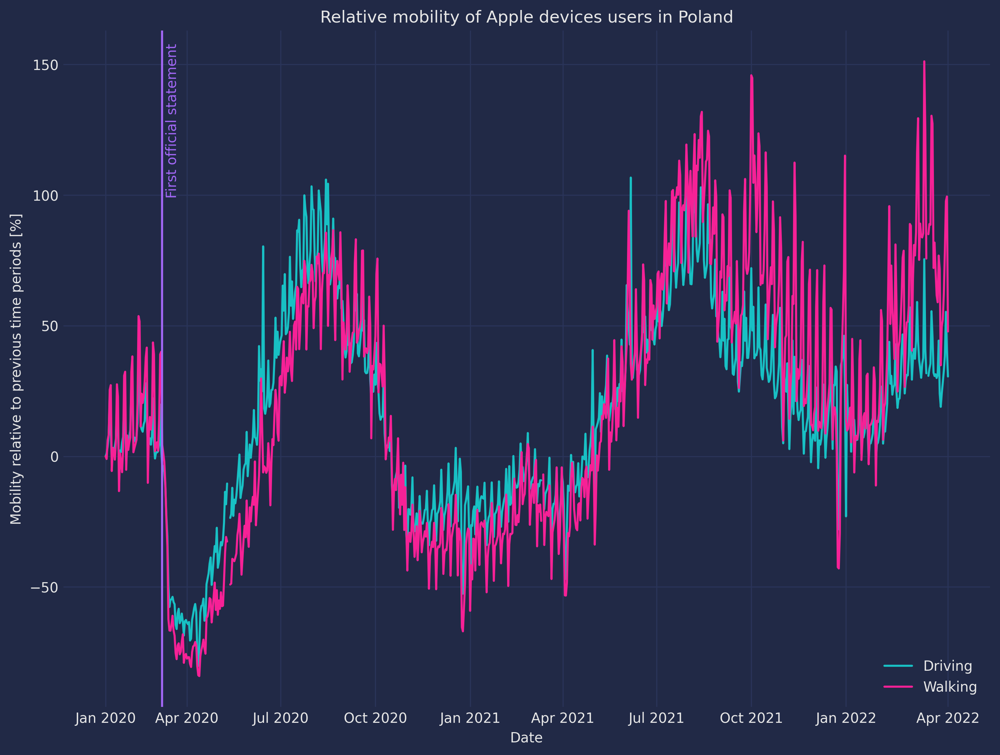

In [90]:
fig, ax = visualize.plot_mobility_data(df_mobility, show=False)

date_pos = df_mobility[df_mobility.date == '2020-03-08'].index[0]

ax.axvline(date_pos, color=visualize.get_theme_colors()[2])
ax.text(date_pos + 3, 100, 'First official statement', rotation=90, color=visualize.get_theme_colors()[2])

plt.show()

TODO: describe the plot

In [94]:
miss_inds_walking = df_mobility.mobility_walking.isna()
miss_inds_driving = df_mobility.mobility_driving.isna()

# we can check whether all the indices are the same
(~(miss_inds_walking ^ miss_inds_driving)).all()

True

In [95]:
df_mobility[miss_inds_walking]

,date,mobility_driving,mobility_walking,day,month,year
119,2020-05-11,NaN,NaN,11,5,2020
120,2020-05-12,NaN,NaN,12,5,2020
424,2021-03-12,NaN,NaN,12,3,2021
798,2022-03-21,NaN,NaN,21,3,2022


In [96]:
df_mobility = df_mobility.bfill()

In [97]:
df_mobility[miss_inds_walking]

,date,mobility_driving,mobility_walking,day,month,year
119,2020-05-11,-23.56,-49.07,11,5,2020
120,2020-05-12,-23.56,-49.07,12,5,2020
424,2021-03-12,-10.20,-6.94,12,3,2021
798,2022-03-21,30.80,85.01,21,3,2022


describe missing data

# Part 3: <font color ='blue'>Data Analysis</font>

IDEA:
* Analyse model for each of selected regions, for each of selected pollutions
* Select those that show highest positive and negative deviations

## 3.1 Overview of the data

The most interesting aspect of the data was to see if air pollution could depend on pandemics. By looking at any plot of pollution throughout the years, we can see, that the data is seasonal, but apparently contains some overall trend. We would like to assess whether this trend stays the same or if it is somehow changed by the pandemic. 

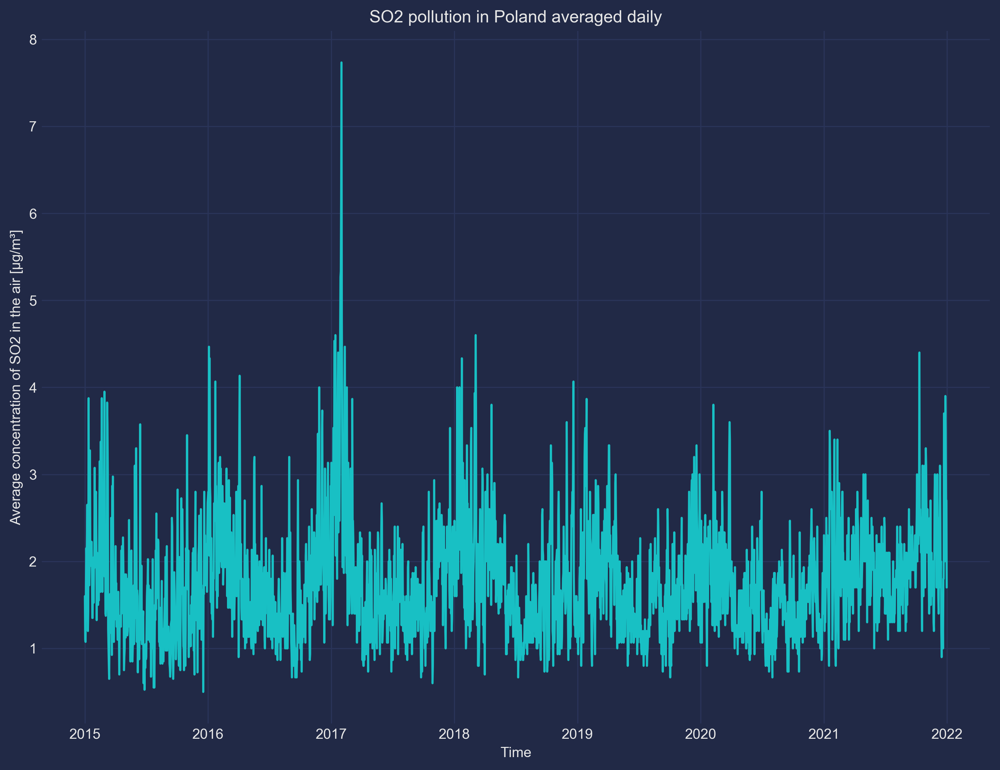

In [6]:
focus_years = list(range(2015, 2022))
# read all the records about SO2 measurements with daily exposition from focus years
df_SO2 = read.query_data_range(years=focus_years, pollutants='SO2', expositions=24) 
# average the measurements over every day
df_SO2_daily = model.group_and_reindex(df_SO2, 'daily')
# plot the data
visualize.plot_timeline_of_pollution(df_SO2_daily, 'SO2', 'daily')

Daily data contains a lot of noise that can make it difficult to tease information out of a chart. Therefore, we can look at the monthly data.

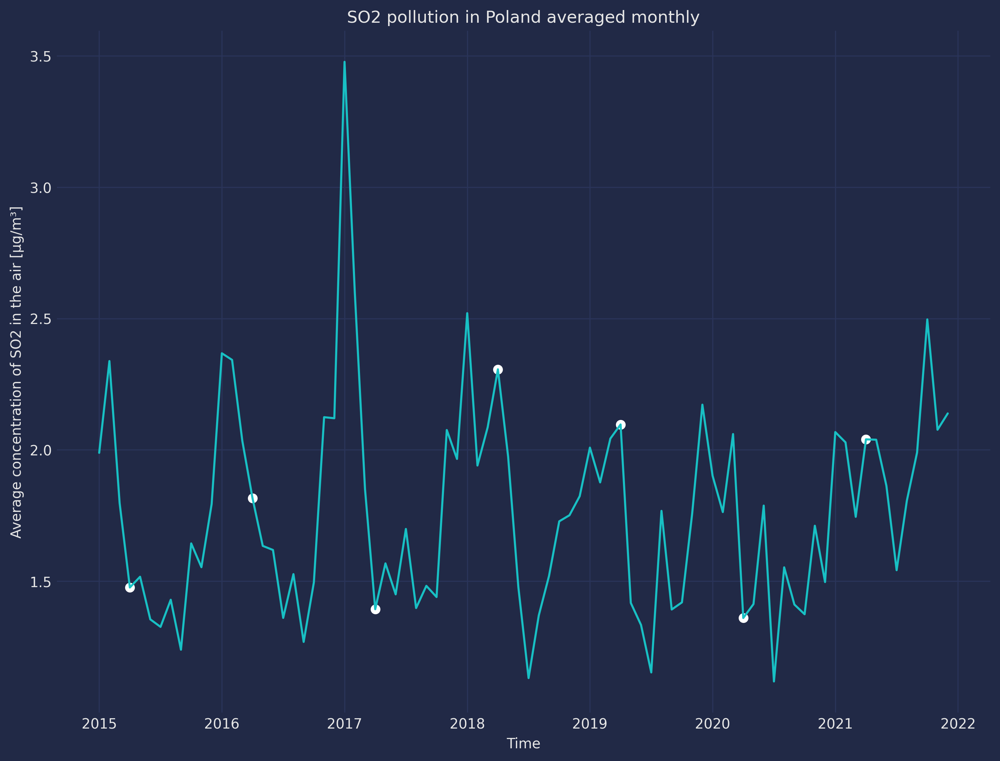

In [16]:
df_SO2_monthly = model.group_and_reindex(df_SO2, 'monthly')
fig, ax = visualize.plot_timeline_of_pollution(df_SO2_monthly, 'SO2', 'monthly', show=False)
# mark Aprils
ax.scatter(range(3, 87, 12), df_SO2_monthly.loc[list(range(3, 87, 12)), 'measurement'], color="white")
plt.show()

In the plot we can see that April 2020 presents the value lower that in any of the previous years -- that is the month when full lockdown went on in Poland.

But looking at the charts might not be enough. We want to have a mathematical proof that 2020 and 2021 are odd. The idea is to make a prediction of time series. TODO: explain a little more

## 3.2 ARIMA preliminary analysis

In order to make a prediction, we decided to use ARIMA model. According to the article [1], ARIMA is a simple and very often sufficient tool to limit simple realtions. Additionally, it does not require immense computational power.

The data we are dealing with is time series: a set of values distributed in time. From the preliminary analysis, the data appears to be seasonal, i.e. there exist some period of time (1 year) which displays similar pattern. We would like to model this data then using AutoRegressive Integrated Moving Average (ARIMA) model. It is actually a combination of three models: AR (autoregressive) I (integrated) MA (moving average) [2, 3]. That means that the value of measurement in the specified time is modelled as depending on the previous values. It also takes into account the seasonality of the data.

TODO: shall we introduce more equations?

The assumption here is that observation $y_t$ in a given moment can be decomposed into parts:

$$y_t = tre_t + sea_t + \epsilon_t$$

where $tre_t$ is the overall trend in the data, $sea_t$ is the component depending on the seasonal change (like here: every year in winter the pollution is higher) and $\epsilon_t$ is some random noise, something which escapes our assumptions. Errors are assumed to be independent and follow normal distribution.

Another important assumption is that $sea_t$ is an an autocorrelated [4] function of time. That means that value in time point $t$ is correlated with its delayed value at time point $t + lag$ for every $t$. The strength of correlation depends on the $lag$ and should be the strongest for the value of $lag$ equal to the length of period.

We are going to check the assumptions for our data using *statsmodels* python package, which automatically decomposes the values. We will also use *pmdarima* package for building ARIMA models and using its utility functions.


* [1]: [Medium Article](https://medium.com/@cdabakoglu/time-series-forecasting-arima-lstm-prophet-with-python-e73a750a9887)
* [2]: [The best Forecast Techniques or how to Predict from Time Series Data -- nice explaination of ARIMA](https://towardsdatascience.com/the-best-forecast-techniques-or-how-to-predict-from-time-series-data-967221811981)
* [3]: [Detailed article on ARIMA on Wikipedia](https://en.wikipedia.org/wiki/Autoregressive_integrated_moving_average)
* [4]: [About autocorrelation in stochastic processes](https://en.wikipedia.org/wiki/Autocorrelation)
* [5]: [statsmodels -- containing function for decomposing and plotting ACF](https://www.statsmodels.org/dev/index.html)
* [6]: [pmdarima -- functions for calculating arima](https://alkaline-ml.com/pmdarima/)


/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


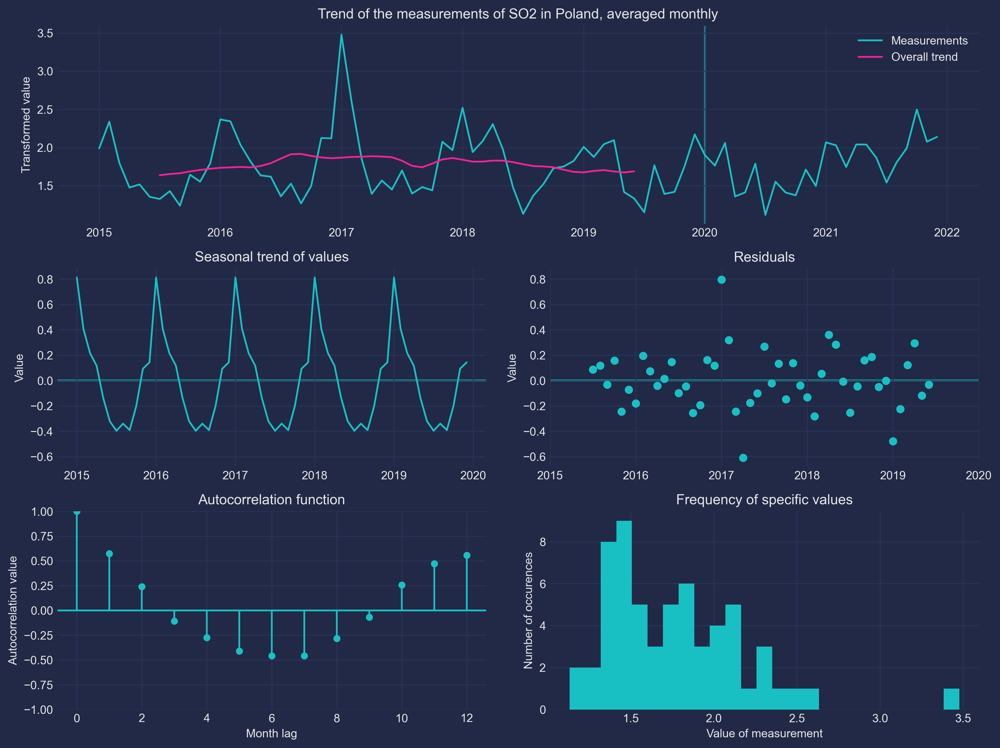

In [20]:
df_SO2_monthly_train, df_SO2_monthly_test = model.train_test_split_on_year(df_SO2_monthly)
decomposition_SO2_monthly = seasonal_decompose(df_SO2_monthly_train.measurement, model='add', period=12)

visualize.plot_full_pre_model_analysis(df_SO2_monthly_train, SO2_monthly_test, decomposition_SO2_monthly, 'SO2', 'monthly', transformed=False)

The plot consists of multiple parts. The top one shows the original data with the division into train (pre-2020) and test (2020-2021) datasets. Magenta line indicates the overall trend present in the data, extracted using `seasonal_decompose` function. It was fit only to the training data. Middle left panel displays the seasonality of variables, i.e. calculated seasonal deviation from the trend. We can clearly see that it exists: in winter months pollution is the highest, while in summer it reach lower values. Residuals (in the equation indicated as $\epsilon$ term) are presented in the middle right plot. Although most of them concentrates around 0, there are some notable outliers. Bottom left panel shows autocorelation function. We can see that values that are shifted by 12 months have positive correlation of over 0.5, while measurements shifted by 6 months have negative correlation of almost -0.5 -- that further proves seasonality of the data. Finally, bottom right plot shows distribution of values in the form of histogram. The data is skewed, which means ARIMA model may not be suitable for the data without any transformation.

There is, however, a way of handlng the skewed data. We can try to transform it using some power transformation [7]. We decided to use Box-Cox transformation, suggested by previously menitoned sources. It transforms the data inputs $y_i$ according to the formula:

$${\displaystyle y_{i}^{(\lambda )}={\begin{cases}{\dfrac {y_{i}^{\lambda }-1}{\lambda }}&{\text{if }}\lambda \neq 0,\\\ln y_{i}&{\text{if }}\lambda =0,\end{cases}}}$$

where $\lambda$ is some parameter. In the *pmdarima* package there are functions to automatically transform data and select some $\lambda$ parameter.

* [7]: [Power transformations](https://en.wikipedia.org/wiki/Power_transform#Box%E2%80%93Cox_transformation)

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


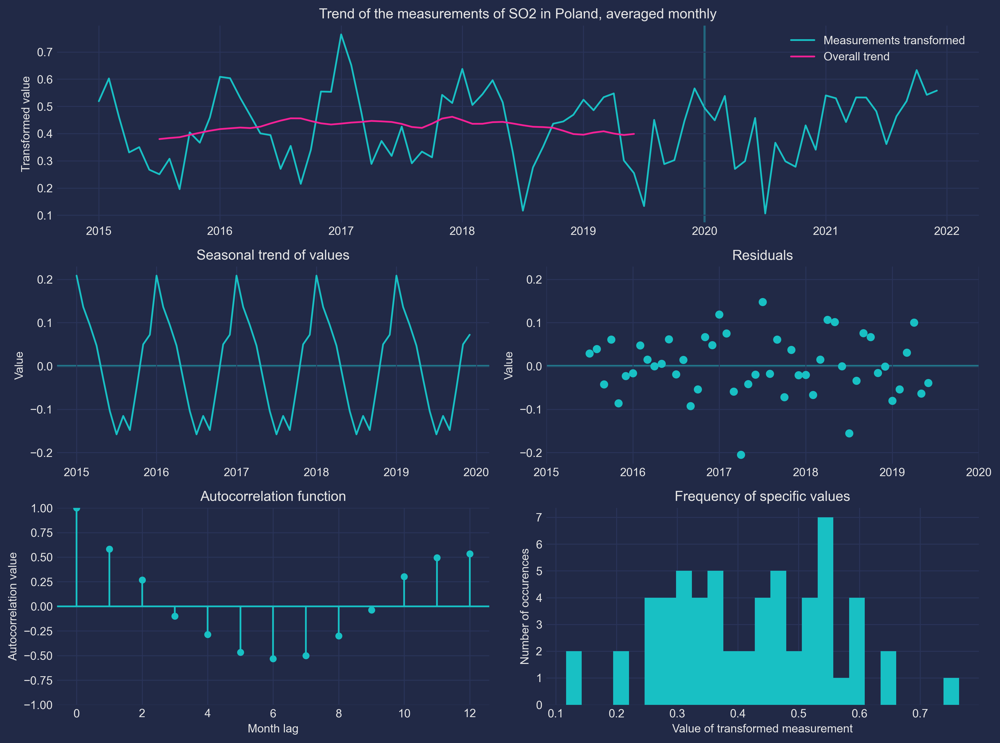

In [25]:
_, df_SO2_monthly_train_tf, df_SO2_monthly_test_tf = model.auto_transform(df_SO2_monthly_train, df_SO2_monthly_test)
decomposition_SO2_monthly_tf = seasonal_decompose(df_SO2_monthly_train_tf.measurement_transformed, model='add', period=12)

visualize.plot_full_pre_model_analysis(df_SO2_monthly_train_tf, df_SO2_monthly_test_tf, decomposition_SO2_monthly_tf, 'SO2', 'monthly', transformed=True)

The above plot shows data after transformations. We can see that the trend is more centralized over the data and the outliers are not that big. Also, distribution of values is more normal. That means that this data is more suitable for training the model. We can do it right now. *pmdarima* automatically selects the best model in its function `auto_arima`

## 3.3 SO2 transformed data model

In [26]:
model_results = dict()
model_results['monthly_SO2_tranformed'] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(df_SO2, 'monthly', True))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=-101.229, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-65.812, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-98.016, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-91.601, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=73.895, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=-98.044, Time=0.45 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=-101.071, Time=1.51 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=-100.582, Time=1.21 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=-88.632, Time=0.17 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=-97.363, Time=1.08 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=-98.576, Time=1.35 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=-99.964, Time=1.50 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=-101.603, Time=1.13 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept

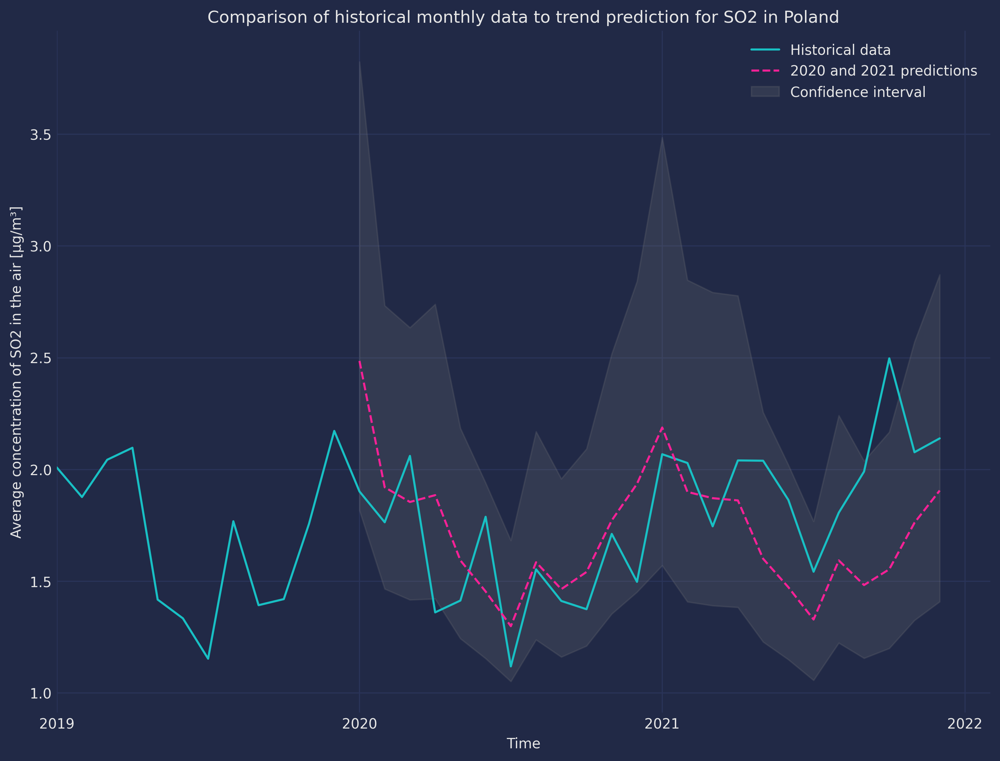

In [33]:
fig, ax = visualize.plot_historical_and_predictions(model_results['monthly_SO2_tranformed'], 'SO2', 'monthly', show=False)
ax.set_xlim(4 * 12, 7 * 12 + 1)
plt.show()

We can see from the plot that the actual historical measurement quite follow the predicted observations with two notable exceptions: April of 2020 and October of 2021.

In [67]:
diff = model.calc_diffs(model_results['monthly_SO2_tranformed']['df_test'])
model.calc_rmse(diff)

0.11862932880680802

It is time to compare the data to the data from Apple devices. First, we want to reduce the seasonal noise in the data by grouping it into months

In [105]:
df_mobility_monthly = df_mobility.groupby(['year', 'month']) \
    [['mobility_driving', 'mobility_walking']] \
    .mean() \
    .reset_index()

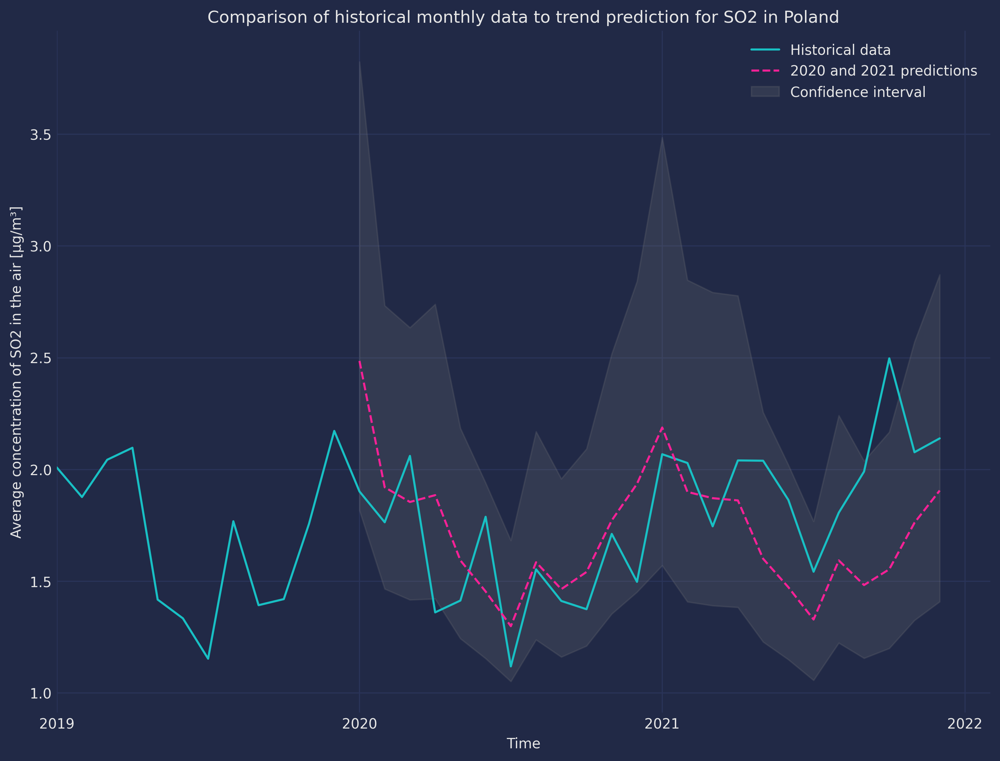

In [108]:
fig, ax = visualize.plot_historical_and_predictions(model_results['monthly_SO2_tranformed'], 'SO2', 'monthly', show=False)
ax.set_xlim(4 * 12, 7 * 12 + 1)
plt.show()

## 3.4 Comparison of deviation from prediction to mobility data

TODO: write something

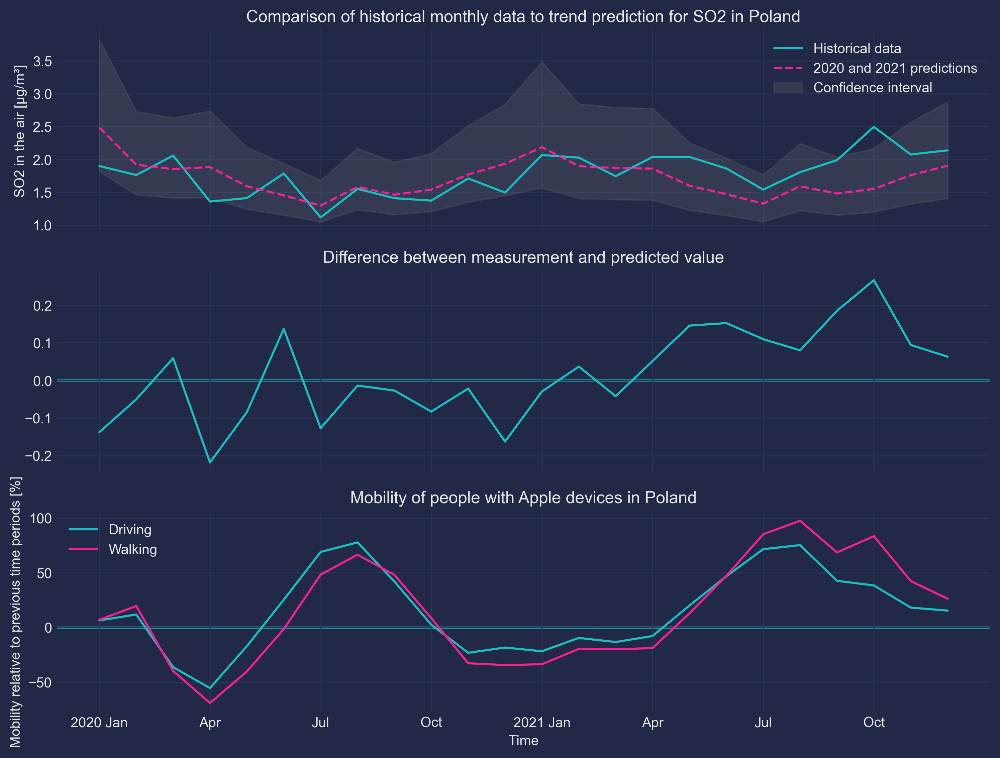

In [126]:
visualize.plot_historical_and_predictions_and_mobility(model_results['monthly_SO2_tranformed'], df_mobility_monthly, 'SO2', 'monthly')

TODO: write about weekly and daily data and why not using it

## 3.5 Modelling PM10 for distinct regions

In [137]:
utils = reload(utils)
read = reload(read)


In the same manner we can analyze other types of polution. For example, PM10

In [160]:
df_PM10 = read.query_data_range(years=focus_years, pollutants='PM10', expositions=24)
df_PM10_monthly = model.group_and_reindex(df_PM10, 'monthly')

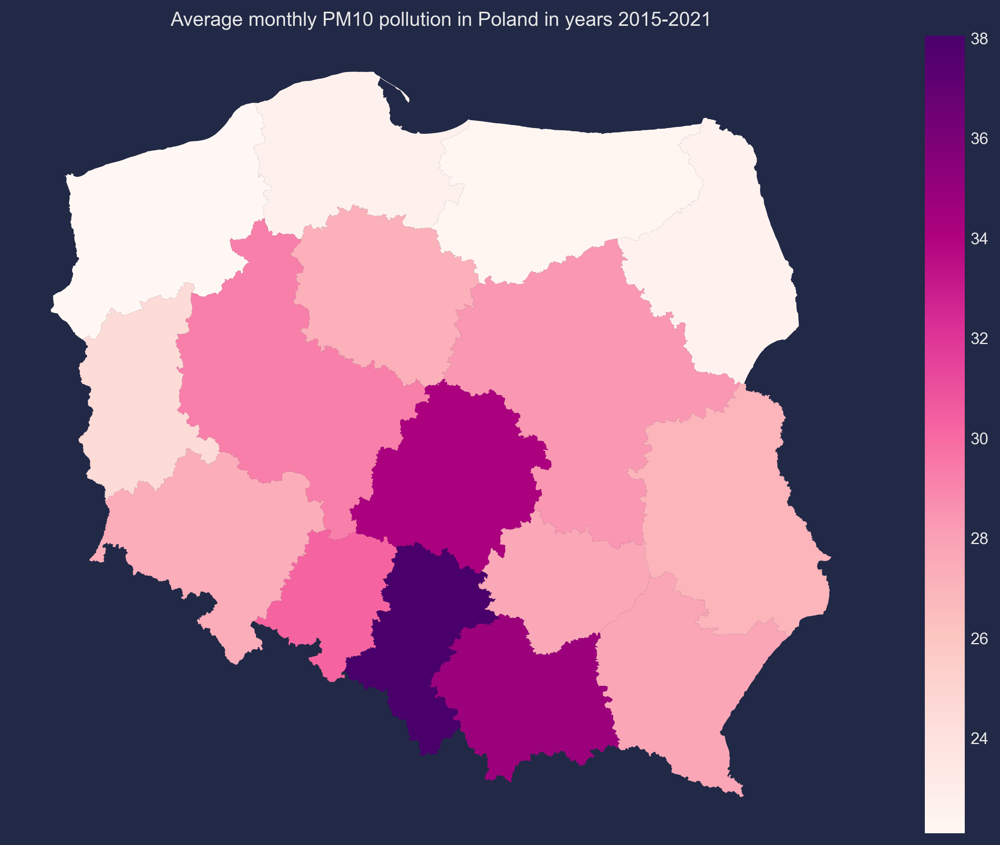

In [161]:
avg_PM10_pollution = df_PM10 \
    .groupby(['timestamp', 'region']) \
    .agg(np.nanmean) \
    .reset_index() \
    .groupby('region') \
    .mean() \
    .reset_index()[['region', 'measurement']]
geo_data_PM10 = geo_data.merge(avg_PM10_pollution, on='region')
visualize.plot_map_with_pollutions(geo_data_PM10, 'Average monthly PM10 pollution in Poland in years 2015-2021')

TODO: describe that for monthly data it is not very normal

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


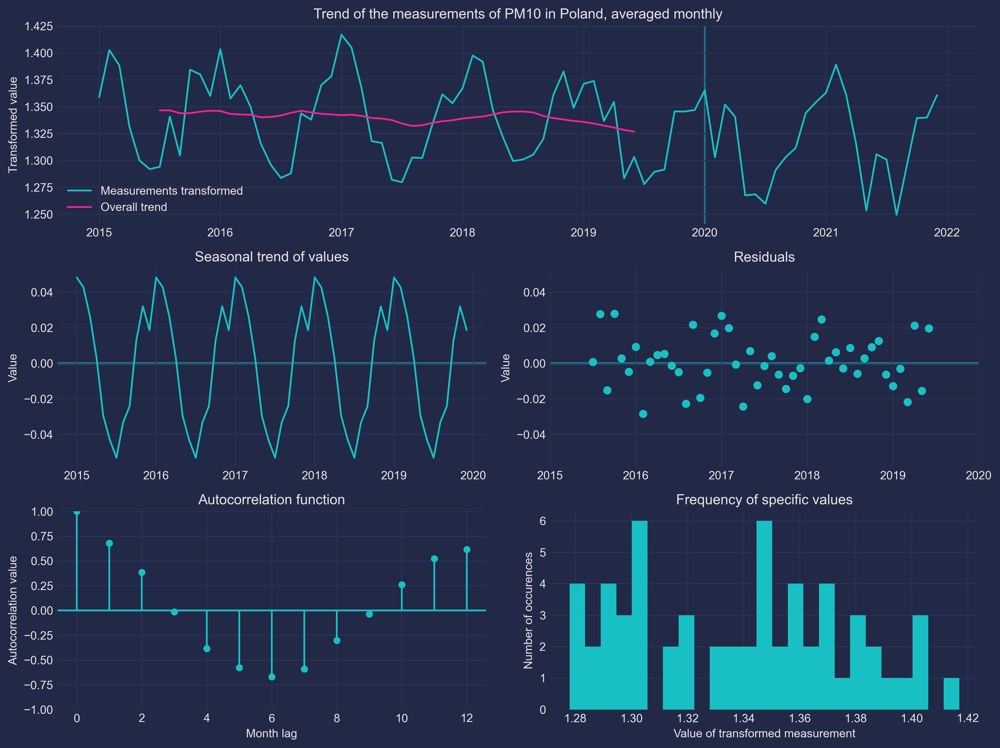

In [170]:
df_PM10_monthly = model.group_and_reindex(df_PM10, 'monthly')
df_PM10_monthly_train, df_PM10_monthly_test = model.train_test_split_on_year(df_PM10_monthly)
_, df_PM10_monthly_train_tf, df_PM10_monthly_test_tf = model.auto_transform(df_PM10_monthly_train, df_PM10_monthly_test)
decomposition_PM10_monthly_tf = seasonal_decompose(df_PM10_monthly_train_tf.measurement_transformed, model='add', period=12)
visualize.plot_full_pre_model_analysis(df_PM10_monthly_train_tf, df_PM10_monthly_test_tf, decomposition_PM10_monthly_tf, 'PM10', 'monthly', transformed=True)

In [172]:
selected_regions = ['MAZOWIECKIE', 'SLASKIE', 'KUJAWSKO-POMORSKIE']

selected_regions_labels = {
    'MAZOWIECKIE': 'Mazowieckie (capital area)', 
    'SLASKIE': 'Śląskie (industrial area)', 
    'KUJAWSKO-POMORSKIE': 'Kujawsko-Pomorskie (green area)'  
}

df_PM10_reg = {region: df_PM10[df_PM10.region == region] for region in selected_regions}
df_PM10_reg_monthly = {region: model.group_and_reindex(df_PM10_reg[region], 'monthly')  for region in selected_regions}

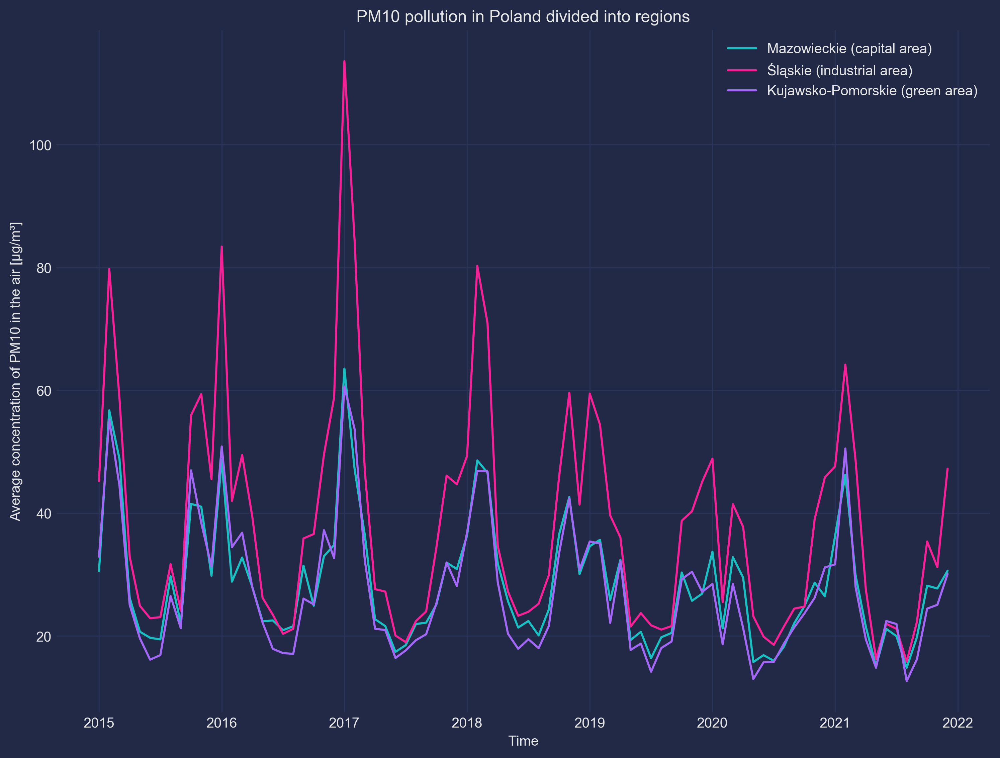

In [173]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()

    for region in selected_regions:
        ax.plot(df_PM10_reg_monthly[region].measurement)

    ax.set_title('PM10 pollution in Poland divided into regions')
    ax.set_xlabel('Time')
    ax.set_xticks(*utils.generate_ticks(df_PM10_reg_monthly[region]))
    ax.set_ylabel('Average concentration of PM10 in the air [μg/m³]')
    ax.legend([selected_regions_labels[region] for region in selected_regions])
    
    plt.show()

In [175]:
model_results_regional = dict()
for region in selected_regions:results)
model_results_regional['PM10'] = {
    region: utils.unpack_to_dict(
        ['model', 'df_train', 'df_test'], 
         model.auto_model(df_PM10_reg[region], 'monthly', transform=True)) for region in selected_regions}

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-289.632, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-310.543, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=190.254, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-306.283, Time=0.09 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-306.012, Time=0.96 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=-313.459, Time=0.66 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=-314.816, Time=1.06 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=-311.165, Time=0.95 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.26 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=2.34 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=-315.618, Time=6.09 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=-315.791, Time=2.97 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : A

In [218]:
visualize = reload(visualize)

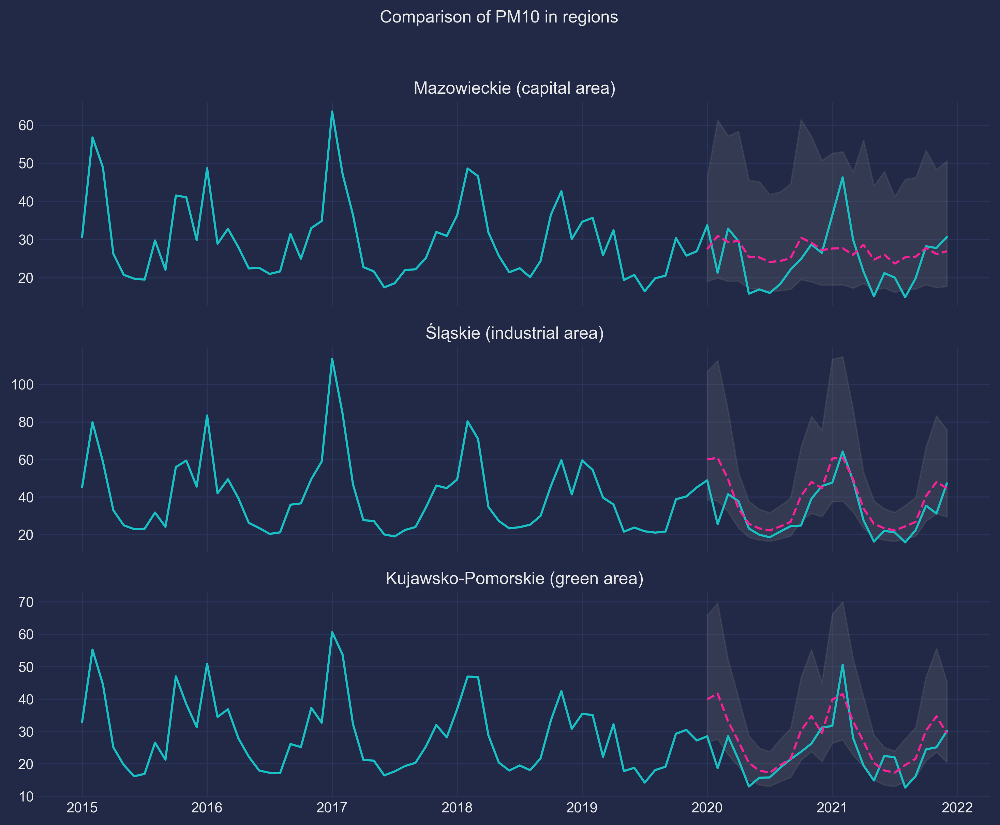

In [219]:
visualize.plot_comparison_of_regions(model_results_regional['PM10'], selected_regions, selected_regions_labels, 
                                    'PM10', 'monthly')

## 3.6 Modelling all pollutants for selected regions

In [209]:
for pollutant, exposition in zip(
    ['NOx', 'CO', 'O3', 'PM2.5'],
    [1, 1, 1, 24]
):
    data = read.query_data_range(years=focus_years, pollutants=pollutant, expositions=exposition)
    model_results_regional[pollutant] = dict()
    for region in selected_regions:
        regional_data = data[data.region == region]
        results = model.auto_model(regional_data, 'monthly', transform=True)
        model_results_regional[pollutant][region] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], results)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-289.632, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-310.543, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=190.254, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-306.283, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-306.012, Time=1.02 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=-313.459, Time=1.06 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=-314.816, Time=2.22 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=-311.165, Time=1.91 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=3.16 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=-315.618, Time=2.30 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=-315.791, Time=1.18 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : A

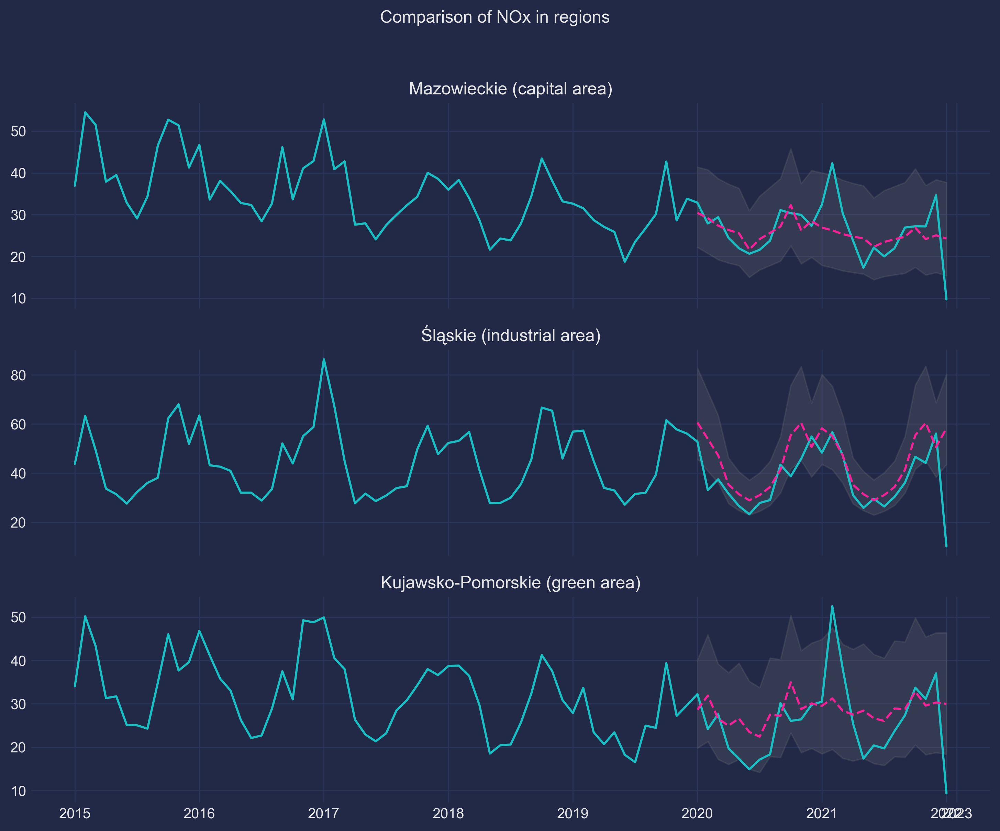

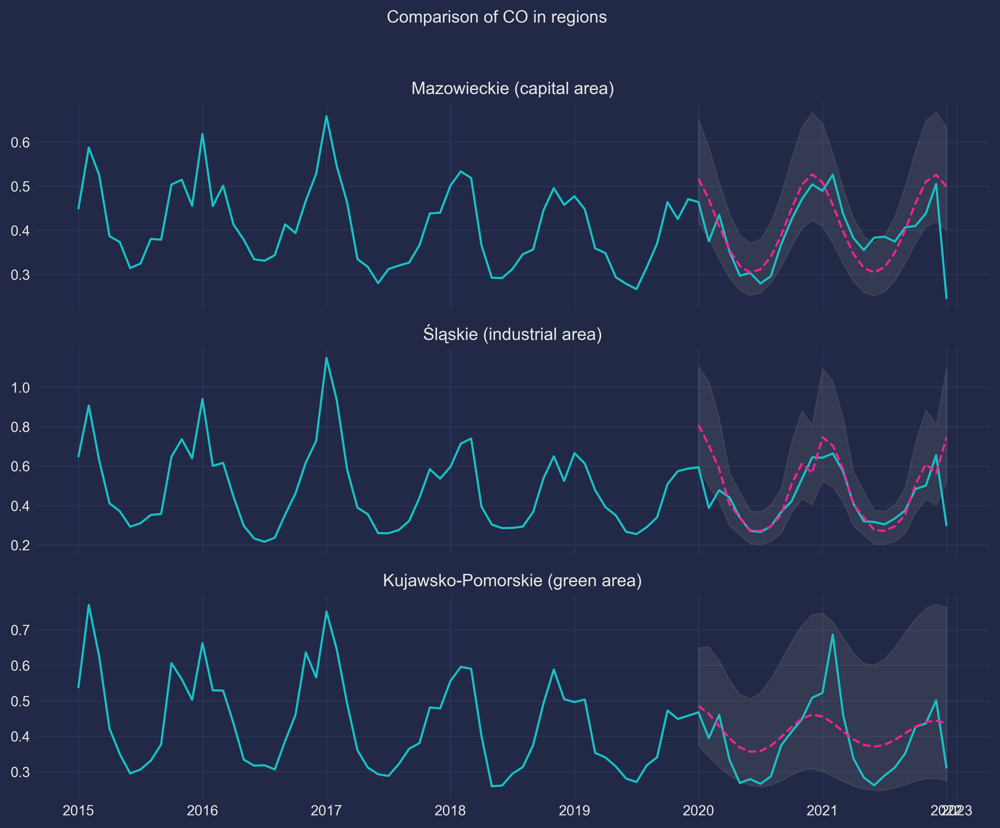

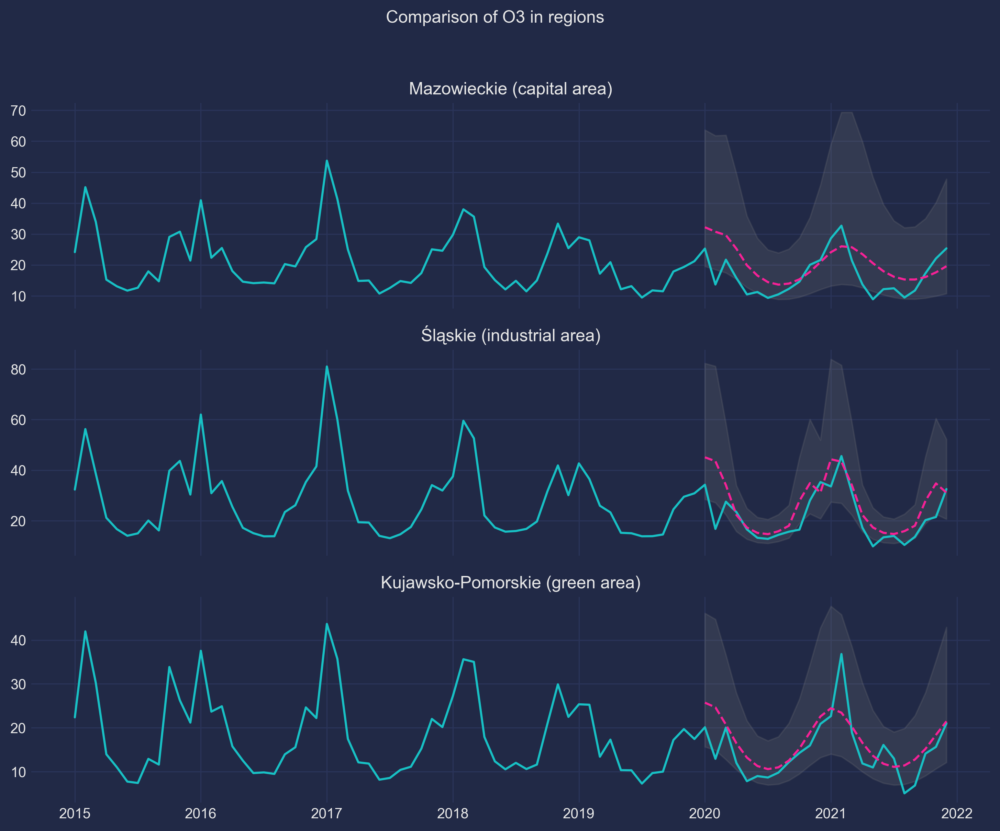

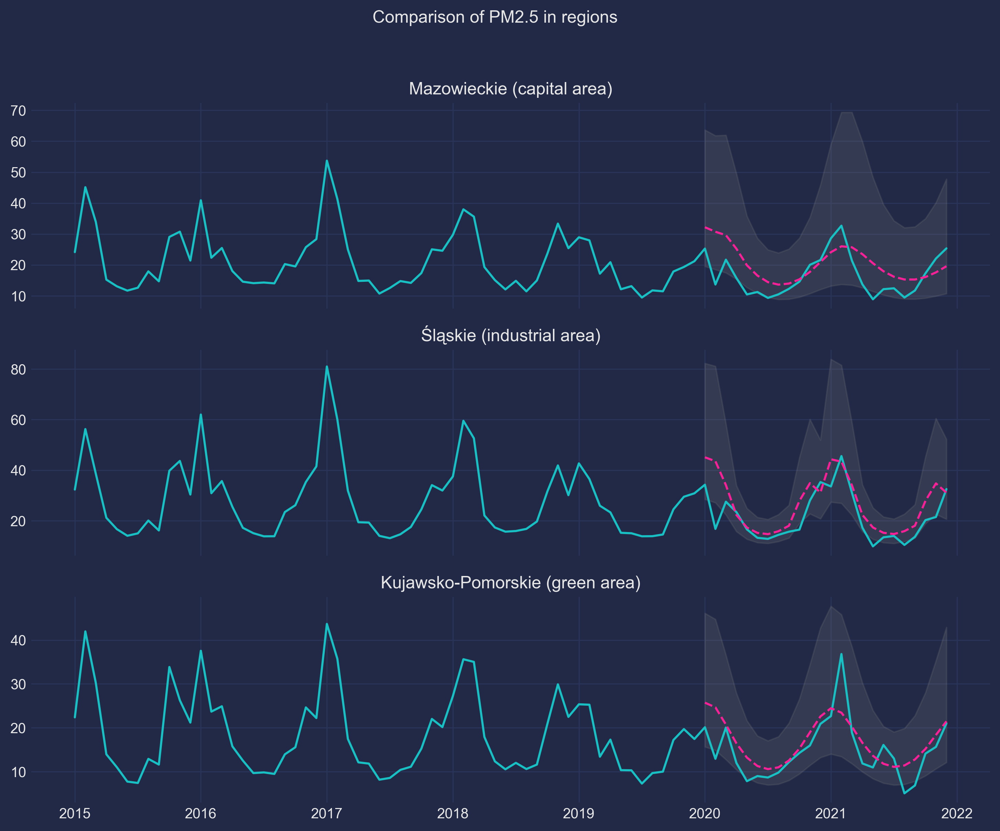

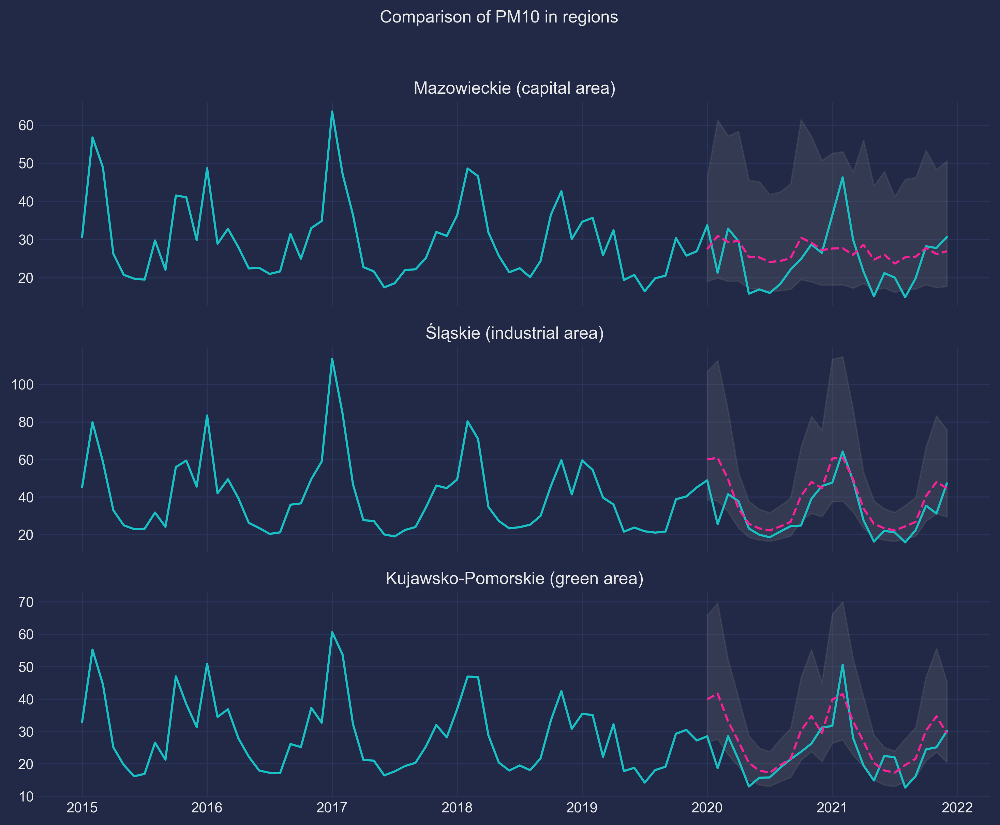

In [220]:
for pollutant in ['NOx', 'CO', 'O3', 'PM2.5', 'PM10']:
    visualize.plot_comparison_of_regions(model_results_regional[pollutant], selected_regions, selected_regions_labels, 
                                    pollutant, 'monthly')

# Part 4: Genre

## 4.1: Which genre of data story did you use?

**Answers:**


## 4.2: Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?

**Answers:**


## 4.3: Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?

**Answers:**


# Part 5: Visualizations

## 5.1: Explain the visualizations you've chosen.

In [ ]:
# your code might go here

**Answers:**


## 5.2: Why are they right for the story you want to tell?

**Answers:**


# Part 6: Discussion
**Think critically about your creation.**

## 6.1: What went well?

**Answers:**


## 6.2: What is still missing? What could be improved? Why?

**Answers:**


# Contributions
- Who did what?

- You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That's what you should explain).

- It is not OK simply to write "All group members contributed equally".

# References